<a href="https://colab.research.google.com/github/iuliatodoran/Crosswalk-Detector/blob/main/Crosswalk_Detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Install & imports**

In [ ]:
!pip -q install opencv-python-headless numpy scipy matplotlib

import os
import cv2
import numpy as np
import json
from collections import deque
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict
from scipy.signal import find_peaks
import matplotlib.pyplot as plt

POSSIBLE_DIRS = [".", "/content", "/content/drive/MyDrive", "/mnt/data"]
COLOR_NAME = "challenge_color_848x480.mp4"
DEPTH_NAME = "challenge_depth_848x480.mp4"

def resolve_path(fname: str) -> str:
    for d in POSSIBLE_DIRS:
        p = os.path.join(d, fname)
        if os.path.exists(p):
            return p
    raise FileNotFoundError(f"Could not find {fname} in {POSSIBLE_DIRS}")

COLOR_PATH = resolve_path(COLOR_NAME)
DEPTH_PATH = resolve_path(DEPTH_NAME)

COLOR_PATH, DEPTH_PATH


('./challenge_color_848x480.mp4', './challenge_depth_848x480.mp4')

**Video reader**

In [ ]:
class DualVideoReader:
    def __init__(self, color_path: str, depth_path: str):
        self.cap_c = cv2.VideoCapture(color_path)
        self.cap_d = cv2.VideoCapture(depth_path)
        if not self.cap_c.isOpened() or not self.cap_d.isOpened():
            raise RuntimeError("Could not open one of the videos.")
        self.w = int(self.cap_c.get(cv2.CAP_PROP_FRAME_WIDTH))
        self.h = int(self.cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
        self.fps = self.cap_c.get(cv2.CAP_PROP_FPS) or 30.0

        w2 = int(self.cap_d.get(cv2.CAP_PROP_FRAME_WIDTH))
        h2 = int(self.cap_d.get(cv2.CAP_PROP_FRAME_HEIGHT))
        if (w2, h2) != (self.w, self.h):
            raise RuntimeError(f"Expected same resolution. RGB=({self.w},{self.h}) Depth=({w2},{h2})")

    def __iter__(self):
        return self

    def read(self) -> Tuple[bool, Optional[np.ndarray], Optional[np.ndarray]]:
        ok_c, frame_c = self.cap_c.read()
        ok_d, frame_d = self.cap_d.read()
        if not ok_c or not ok_d:
            return False, None, None
        return True, frame_c, frame_d

    def release(self):
        self.cap_c.release()
        self.cap_d.release()

reader = DualVideoReader(COLOR_PATH, DEPTH_PATH)
reader.w, reader.h, reader.fps

(848, 480, 30.0)

**Preview a few frames**

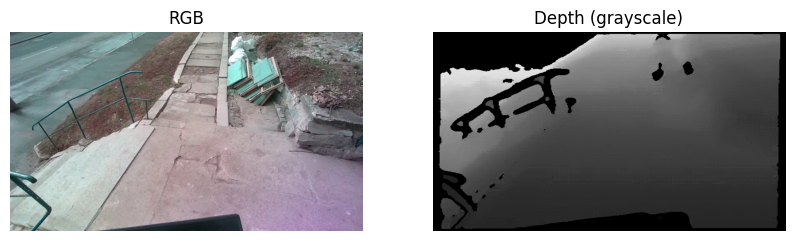

In [ ]:
def to_gray_depth(depth_bgr: np.ndarray) -> np.ndarray:
    if depth_bgr.ndim == 3:
        g = cv2.cvtColor(depth_bgr, cv2.COLOR_BGR2GRAY)
    else:
        g = depth_bgr
    return g

ok, c0, d0 = reader.read()
reader.release()

if ok:
    d0g = to_gray_depth(d0)
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1); plt.imshow(cv2.cvtColor(c0, cv2.COLOR_BGR2RGB)); plt.title("RGB"); plt.axis("off")
    plt.subplot(1,2,2); plt.imshow(d0g, cmap='gray'); plt.title("Depth (grayscale)"); plt.axis("off")
    plt.show()
else:
    print("Could not read first frames.")

Converts the depth frame to grayscale and shows RGB + Depth side by side

**Common utils**

In [ ]:
@dataclass
class Detection:
    kind: str            # stairs or crosswalk
    bbox: Tuple[int,int,int,int]
    distance_units: float
    score: float

def crop_bottom(img: np.ndarray, bottom_ratio: float = 0.45, margin_ratio: float = 0.06):
    h, w = img.shape[:2]
    y0 = int(h * (1.0 - bottom_ratio))
    x0 = int(w * margin_ratio)
    x1 = int(w * (1.0 - margin_ratio))
    return img[y0:h, x0:x1], (x0, y0)

def draw_bbox_label(img: np.ndarray, bbox, label:str, color=(0,255,0)):
    x,y,w,h = bbox
    cv2.rectangle(img, (x,y), (x+w, y+h), color, 2)
    cv2.putText(img, label, (x, max(15, y-6)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2, cv2.LINE_AA)

class TemporalSmoother:
    def __init__(self, maxlen=5):
        self.buf = deque(maxlen=maxlen)
    def push(self, dets: List[Detection]):
        self.buf.append(dets)
    def fused(self) -> List[Detection]:
        #heuristic: keep detections that appear frequently by kind
        if not self.buf:
            return []
        # flatten
        all_dets = sum(self.buf, [])
        best_by_kind = {}
        for d in all_dets:
            if d.kind not in best_by_kind or d.score > best_by_kind[d.kind].score:
                best_by_kind[d.kind] = d
        return list(best_by_kind.values())

ROI crops the bottom part of the frame, drawing overlays, a simple temporal smoother picks the best scored detection across a short window

**Depth preprocessing & gradients**

In [ ]:
def preprocess_depth(depth_gray: np.ndarray) -> np.ndarray:
    depth = depth_gray.copy()
    depth = cv2.medianBlur(depth, 3)
    return depth

def vertical_gradient(depth: np.ndarray) -> np.ndarray:
    gy = cv2.Sobel(depth, cv2.CV_32F, 0, 1, ksize=3)
    return np.abs(gy)

def threshold_grad(grad: np.ndarray) -> np.ndarray:
    m, s = float(np.mean(grad)), float(np.std(grad))
    thr = m + 1.0 * s
    mask = (grad > thr).astype(np.uint8) * 255
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5,5), np.uint8))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((3,3), np.uint8))
    return mask

Smooth depth and detect strong vertical gradients; steps are horizontal stripes of high gradient

**Stairs detector**

In [ ]:
def detect_stairs(depth_gray: np.ndarray, full_offset: Tuple[int,int]) -> List[Detection]:
    depth = preprocess_depth(depth_gray)
    grad = vertical_gradient(depth)
    mask = threshold_grad(grad)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    H, W = mask.shape[:2]
    candidates: List[Detection] = []
    x_off, y_off = full_offset

    for c in contours:
        x,y,w,h = cv2.boundingRect(c)
        # heuristics: wide and low-height = horizontal band
        if w < W * 0.25:
            continue
        if h > H * 0.20:
            continue
        y_probe = min(H-1, y+h+2)
        depth_slice = depth[max(0,y_probe-2):min(H, y_probe+3), x:x+w]
        if depth_slice.size == 0:
            continue
        dist_units = float(np.median(depth_slice))
        grad_strength = float(np.mean(grad[y:y+h, x:x+w]))
        score = 0.6*(w/H) + 0.4*(grad_strength / (np.std(grad)+1e-6))

        candidates.append(Detection(
            kind="stairs",
            bbox=(x + x_off, y + y_off, w, h),
            distance_units=dist_units,
            score=score
        ))

    candidates.sort(key=lambda d: d.score, reverse=True)
    return candidates[:1]

Detect horizontal stripes in the depth gradient mask, then keep the strongest as the staircase candidate

**Crosswalk preprocessing (RGB - white bands mask)**

In [ ]:
def normalize_brightness(img_bgr: np.ndarray) -> np.ndarray:
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    L, A, B = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    L2 = clahe.apply(L)
    lab2 = cv2.merge([L2, A, B])
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

def white_mask(img_bgr: np.ndarray) -> np.ndarray:
    # Both an adaptive threshold on L and a strict RGB white check fused
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    L = lab[:,:,0]
    m, s = float(np.mean(L)), float(np.std(L))
    thrL = np.clip(m + 0.6*s, 0, 255)
    mask1 = (L > thrL).astype(np.uint8)*255

    r,g,b = img_bgr[:,:,2], img_bgr[:,:,1], img_bgr[:,:,0]
    mask2 = ((r>200) & (g>200) & (b>200)).astype(np.uint8)*255

    mask = cv2.bitwise_or(mask1, mask2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((3,3), np.uint8))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((7,3), np.uint8))
    return mask

Apply CLAHE on the L channel, then build a robust white areas mask

**Crosswalk detector (MVP, projection + periodicity)**

In [ ]:
def detect_crosswalk(rgb_roi: np.ndarray, depth_roi: np.ndarray, full_offset: Tuple[int,int]) -> List[Detection]:
    norm = normalize_brightness(rgb_roi)
    mask = white_mask(norm)

    H, W = mask.shape[:2]
    proj = np.sum(mask==255, axis=1)

    peaks, props = find_peaks(proj, height=np.percentile(proj, 75), distance=8)

    detections: List[Detection] = []
    if len(peaks) >= 3:
        y_min = int(max(0, np.min(peaks) - 6))
        y_max = int(min(H-1, np.max(peaks) + 6))
        col_hist = np.sum(mask[y_min:y_max+1]==255, axis=0)
        xs = np.where(col_hist > 0.15*(y_max-y_min+1))[0]
        if len(xs) > 0:
            x_min, x_max = int(xs[0]), int(xs[-1])
            region = depth_roi[y_min:y_max+1, x_min:x_max]
            if region.size > 0:
                var_depth = float(np.var(region))
                if (x_max - x_min) > W*0.3 and var_depth < (np.std(depth_roi)+1e-6)*2.5:
                    y_probe = min(H-1, y_max+1)
                    dist_units = float(np.median(depth_roi[max(0,y_probe-2):min(H,y_probe+3), x_min:x_max]))
                    score = 0.5*(len(peaks)) + 0.5*((x_max-x_min)/W)
                    detections.append(Detection(
                        kind="crosswalk",
                        bbox=(x_min+full_offset[0], y_min+full_offset[1], (x_max-x_min), (y_max-y_min)),
                        distance_units=dist_units,
                        score=score
                    ))
    return detections

Project the white mask along rows to find multiple parallel bands, form a bounding box, validate with depth variance and astimate a distance proxy

**Main loop: run both detectors, overlay and save**

In [ ]:
def det_to_serializable(d):
    x, y, w, h = d.bbox
    return {
        "kind": d.kind,
        "bbox": [int(x), int(y), int(w), int(h)],
        "distance_units": float(d.distance_units),
        "score": float(d.score),
    }

def process_video(color_path: str, depth_path: str,
                  out_video: str = "demo_overlay.mp4",
                  out_jsonl: str = "detections.jsonl",
                  roi_ratio: float = 0.45,
                  margin_ratio: float = 0.06,
                  max_frames: Optional[int] = None):
    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open videos.")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH))
    H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    writer = cv2.VideoWriter(out_video, fourcc, FPS, (W, H))
    smoother = TemporalSmoother(maxlen=5)

    with open(out_jsonl, "w") as fjson:
        idx = 0
        while True:
            ok_c, frgb = cap_c.read()
            ok_d, fdep_bgr = cap_d.read()
            if not ok_c or not ok_d:
                break
            fdep = to_gray_depth(fdep_bgr)

            rgb_roi, (x_off, y_off) = crop_bottom(frgb, roi_ratio, margin_ratio)
            dep_roi, _ = crop_bottom(fdep, roi_ratio, margin_ratio)

            stairs_dets = detect_stairs(dep_roi, (x_off, y_off))
            cross_dets = detect_crosswalk(rgb_roi, dep_roi, (x_off, y_off))

            all_dets = stairs_dets + cross_dets
            smoother.push(all_dets)
            fused = smoother.fused()

            fused.sort(key=lambda d: 0 if d.kind=="stairs" else 1)
            for d in fused:
                color = (0,255,255) if d.kind=="stairs" else (0,255,0)
                label = f"{d.kind.upper()}  dist={d.distance_units:.1f} (units)"
                draw_bbox_label(frgb, d.bbox, label, color=color)

            writer.write(frgb)

            rec = {
                "frame_idx": int(idx),
                "detections": [det_to_serializable(d) for d in fused]
            }
            fjson.write(json.dumps(rec) + "\n")

            idx += 1
            if max_frames is not None and idx >= max_frames:
                break

    writer.release()
    cap_c.release()
    cap_d.release()
    return out_video, out_jsonl

out_video, out_jsonl = process_video(COLOR_PATH, DEPTH_PATH, max_frames=300)
out_video, out_jsonl

('demo_overlay.mp4', 'detections.jsonl')

Runs both detectors on the bottom ROI, overlays bounding boxes with distances and writes a short demo

**Visual check**

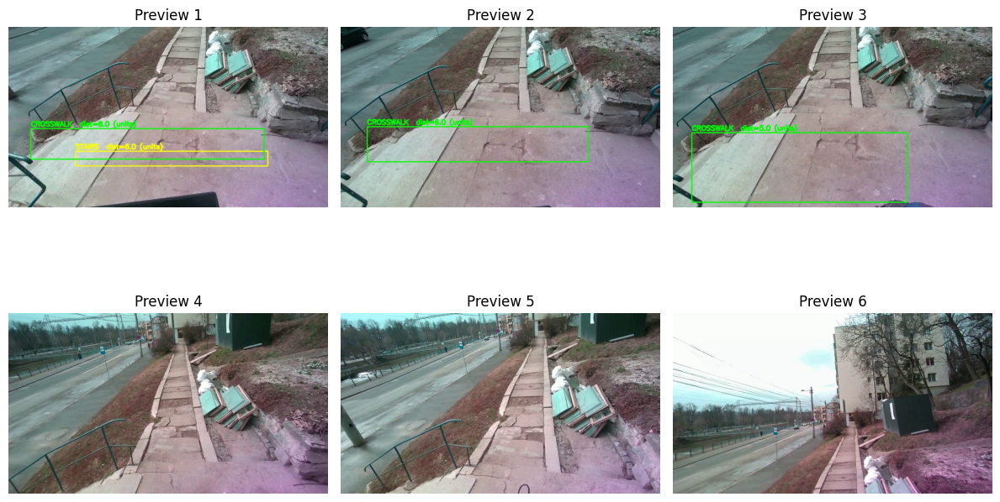

In [ ]:
cap = cv2.VideoCapture(out_video)
frames_to_show = 6
step = max(1, int((cap.get(cv2.CAP_PROP_FRAME_COUNT) or 120) // frames_to_show))
shown = 0
i = 0
imgs = []
while shown < frames_to_show:
    cap.set(cv2.CAP_PROP_POS_FRAMES, i)
    ok, fr = cap.read()
    if not ok: break
    imgs.append(cv2.cvtColor(fr, cv2.COLOR_BGR2RGB))
    shown += 1
    i += step
cap.release()

plt.figure(figsize=(12,8))
for k,im in enumerate(imgs):
    plt.subplot(2,3,k+1); plt.imshow(im); plt.axis("off"); plt.title(f"Preview {k+1}")
plt.tight_layout(); plt.show()

**Preview for crosswalks & stairs**

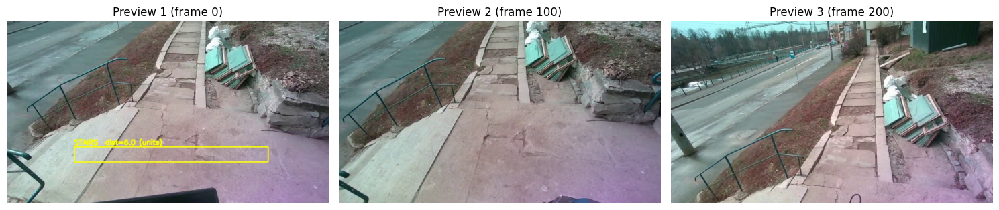

In [ ]:
import matplotlib.pyplot as plt
import cv2

def preview_frames(video_path, frame_indices=[0, 100, 200, 300, 400, 500], cols=3):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise RuntimeError(f"Could not open {video_path}")

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = [i for i in frame_indices if i < total_frames]

    plt.figure(figsize=(15, 8))
    for i, idx in enumerate(frame_indices):
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, frame = cap.read()
        if not ok:
            continue
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.subplot(int(np.ceil(len(frame_indices)/cols)), cols, i+1)
        plt.imshow(frame_rgb)
        plt.title(f"Preview {i+1} (frame {idx})")
        plt.axis("off")
    plt.tight_layout()
    plt.show()
    cap.release()

preview_frames("demo_overlay_v6.mp4", frame_indices=[0, 100, 200, 300, 400, 500, 600])



---



# This is where i gave up on the stairs



---



In [ ]:
import cv2, numpy as np, json
from dataclasses import dataclass
from typing import List, Tuple, Optional
from scipy.signal import find_peaks
from collections import deque

PARAM = {
    "road_S_max": 65,
    "road_V_min": 70,
    "road_V_max": 205,

    "white_L_sigma": 0.6,
    "rgb_white": 200,

    "red_S_min": 90,
    "red_V_min": 60,

    "ban_grad_sigma": 1.2,

    "zebra_peaks_min": 3,
    "zebra_diff_std": 10,
    "zebra_width_frac": 0.35,
    "zebra_angle_deg": 10.0,

    "red_width_frac": 0.45,
    "red_area_frac": 0.03,
    "red_angle_deg": 12.0,

    "score_min": 0.6
}

@dataclass
class Detection:
    kind: str
    bbox: Tuple[int,int,int,int]
    distance_units: float
    score: float

class TemporalSmoother:
    def __init__(self, maxlen=5):
        self.buf = deque(maxlen=maxlen)
    def push(self, dets: List[Detection]): self.buf.append(dets)
    def fused(self) -> List[Detection]:
        if not self.buf: return []
        all_dets = sum(self.buf, [])
        best = {}
        for d in all_dets:
            if d.kind not in best or d.score > best[d.kind].score:
                best[d.kind] = d
        return list(best.values())

def normalize_brightness(bgr):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    L,A,B = cv2.split(lab)
    L2 = cv2.createCLAHE(2.0, (8,8)).apply(L)
    return cv2.cvtColor(cv2.merge([L2,A,B]), cv2.COLOR_LAB2BGR)

def white_mask_strict(bgr):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    L = lab[:,:,0].astype(np.float32)
    thr = float(np.mean(L) + PARAM["white_L_sigma"]*np.std(L))
    m1 = (L > thr)
    r,g,b = bgr[:,:,2], bgr[:,:,1], bgr[:,:,0]
    m2 = (r > PARAM["rgb_white"]) & (g > PARAM["rgb_white"]) & (b > PARAM["rgb_white"])
    mask = ((m1 | m2).astype(np.uint8))*255
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((3,3), np.uint8))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((9,3), np.uint8))
    return mask

def red_mask_hsv(bgr):
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    H,S,V = cv2.split(hsv)
    m1 = (H < 12)  & (S > PARAM["red_S_min"]) & (V > PARAM["red_V_min"])
    m2 = (H > 158) & (S > PARAM["red_S_min"]) & (V > PARAM["red_V_min"])
    mask = (m1 | m2).astype(np.uint8)*255
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((3,3), np.uint8))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((11,3), np.uint8))
    return mask

def road_mask_hsv(bgr):
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    S,V = hsv[:,:,1], hsv[:,:,2]
    mask = ((S < PARAM["road_S_max"]) & (V > PARAM["road_V_min"]) & (V < PARAM["road_V_max"])).astype(np.uint8)*255
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  np.ones((3,3), np.uint8))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((7,7), np.uint8))
    return mask

def preprocess_depth(depth_gray): return cv2.medianBlur(depth_gray, 3)
def vertical_gradient(depth):     return np.abs(cv2.Sobel(depth, cv2.CV_32F, 0, 1, ksize=3))
def depth_ban_mask(depth_roi):
    g = vertical_gradient(preprocess_depth(depth_roi)).astype(np.float32)
    m, s = float(np.mean(g)), float(np.std(g) + 1e-6)
    ban = (g > (m + PARAM["ban_grad_sigma"]*s)).astype(np.uint8)*255
    return cv2.morphologyEx(ban, cv2.MORPH_DILATE, np.ones((9,9), np.uint8))

def mean_line_angle_deg(edge_img):
    lines = cv2.HoughLinesP(edge_img, 1, np.pi/180, threshold=70, minLineLength=60, maxLineGap=12)
    if lines is None: return 90.0
    angs=[]
    for (x1,y1,x2,y2) in lines[:,0,:]:
        dx,dy = x2-x1, y2-y1
        if dx==0: continue
        a = ((np.degrees(np.arctan2(dy,dx))+90+180)%180)-90
        angs.append(abs(a))
    return float(np.median(angs)) if angs else 90.0

CROSS_POLY = np.array([
    [0.00, 0.55], [0.62, 0.55], [0.52, 0.85], [0.00, 0.95]
], dtype=np.float32)

def make_poly_mask(shape_hw, poly_norm):
    H, W = shape_hw
    pts = np.stack([poly_norm[:,0]*W, poly_norm[:,1]*H], axis=1).astype(np.int32)
    mask = np.zeros((H,W), np.uint8)
    cv2.fillPoly(mask, [pts], 255)
    return mask

#Crosswalk detector (white-zebra or red-panel)
def detect_crosswalk_final(rgb_full: np.ndarray, depth_full: np.ndarray) -> List[Detection]:
    H,W = rgb_full.shape[:2]
    poly = make_poly_mask((H,W), CROSS_POLY)

    norm = normalize_brightness(rgb_full)
    wmask = white_mask_strict(norm)
    rmask = red_mask_hsv(norm)
    road  = road_mask_hsv(rgb_full)
    ban   = depth_ban_mask(depth_full)

    cand = cv2.bitwise_or(wmask, rmask)
    cand = cv2.bitwise_and(cand, road)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(ban))
    cand = cv2.bitwise_and(cand, poly)

    detections: List[Detection] = []

    # Mode A: white zebra periodicity
    proj = np.sum(cand==255, axis=1)
    if np.any(proj):
        thr = np.percentile(proj[proj>0], 75)
        peaks, _ = find_peaks(proj, height=thr, distance=12)
        if len(peaks) >= PARAM["zebra_peaks_min"]:
            diffs = np.diff(peaks)
            if len(diffs) >= 2 and np.std(diffs) <= PARAM["zebra_diff_std"]:
                y_min = max(0, int(np.min(peaks)-6))
                y_max = min(H-1, int(np.max(peaks)+6))
                col_hist = np.sum(cand[y_min:y_max+1]==255, axis=0)
                xs = np.where(col_hist > 0.22*(y_max-y_min+1))[0]
                if xs.size>0:
                    x_min, x_max = int(xs[0]), int(xs[-1])
                    if (x_max-x_min) > PARAM["zebra_width_frac"]*W:
                        edges = cv2.Canny(cand[y_min:y_max+1, x_min:x_max], 60, 120)
                        ang = mean_line_angle_deg(edges)
                        if ang <= PARAM["zebra_angle_deg"]:
                            dist = float(np.median(depth_full[max(0,y_max-2):min(H,y_max+3), x_min:x_max]))
                            score = 0.5*len(peaks) + 0.5*((x_max-x_min)/max(1,W))
                            detections.append(Detection("crosswalk",(x_min,y_min,x_max-x_min,y_max-y_min),dist,score))

    # Mode B: red painted panel
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(rmask, connectivity=8)
    if num_labels>1:
        idx = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
        x,y,w,h,area = stats[idx, cv2.CC_STAT_LEFT], stats[idx, cv2.CC_STAT_TOP], \
                       stats[idx, cv2.CC_STAT_WIDTH], stats[idx, cv2.CC_STAT_HEIGHT], \
                       stats[idx, cv2.CC_STAT_AREA]
        comp = np.zeros_like(rmask); comp[labels==idx]=255
        inside = np.sum(cv2.bitwise_and(comp, poly)==255)/(area+1e-6)
        onroad = np.sum(cv2.bitwise_and(comp, road)==255)/(area+1e-6)
        noban  = 1.0 - np.sum(cv2.bitwise_and(comp, ban)==255)/(area+1e-6)
        edges  = cv2.Canny(comp, 60, 120)
        ang    = mean_line_angle_deg(edges)
        if w>PARAM["red_width_frac"]*W and h<0.35*H and area>PARAM["red_area_frac"]*W*H \
           and inside>0.6 and onroad>0.6 and noban>0.85 and ang<=PARAM["red_angle_deg"]:
            dist = float(np.median(depth_full[max(0,y+h-2):min(H,y+h+3), x:x+w]))
            score = 0.6*(w/W) + 0.4*onroad
            detections.append(Detection("crosswalk",(x,y,w,h),dist,score))

    detections.sort(key=lambda d: d.score, reverse=True)
    return detections[:1]

# Processing loop
def run_crosswalk_only(color_path: str, depth_path: str,
                       out_video: str = "crosswalk_only.mp4",
                       out_jsonl: str = "crosswalk_only.jsonl",
                       max_frames: Optional[int] = None):
    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open videos.")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0

    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), FPS, (W,H))
    smoother = TemporalSmoother(maxlen=5)

    with open(out_jsonl, "w") as fjson:
        idx = 0
        while True:
            ok_c, frgb = cap_c.read()
            ok_d, fdep_bgr = cap_d.read()
            if not ok_c or not ok_d: break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets = detect_crosswalk_final(frgb, fdep)
            smoother.push(dets)
            fused = [d for d in smoother.fused() if d.score >= PARAM["score_min"]]

            for d in fused:
                x,y,w,h = d.bbox
                cv2.rectangle(frgb, (x,y), (x+w,y+h), (0,255,0), 2)
                cv2.putText(frgb, f"CROSSWALK  dist={d.distance_units:.1f} (units)",
                            (x, max(18,y-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)

            writer.write(frgb)
            rec = {"frame_idx": int(idx),
                   "detections": [{"kind": d.kind, "bbox":[int(x) for x in d.bbox],
                                   "distance_units": float(d.distance_units),
                                   "score": float(d.score)} for d in fused]}
            fjson.write(json.dumps(rec) + "\n")

            idx += 1
            if max_frames is not None and idx >= max_frames: break

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl

# Quick run: first minute only
def frames_for_seconds(video_path: str, seconds: float, default_fps: float = 30.0) -> int:
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or default_fps
    n   = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    return min(int(round(seconds*fps)), n)

first_minute = frames_for_seconds(COLOR_PATH, 60.0)
out_vid, out_json = run_crosswalk_only(COLOR_PATH, DEPTH_PATH,
                                       out_video="crosswalk_only_1min.mp4",
                                       out_jsonl="crosswalk_only_1min.jsonl",
                                       max_frames=first_minute)
out_vid, out_json

('crosswalk_only_1min.mp4', 'crosswalk_only_1min.jsonl')

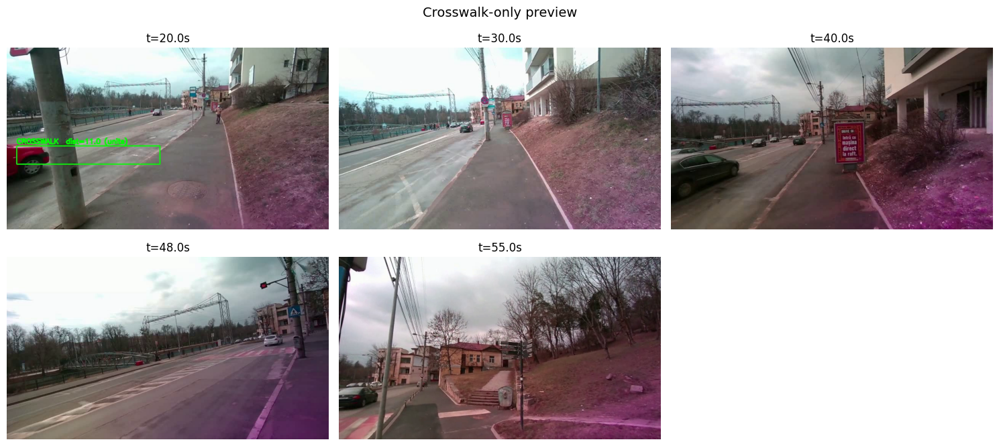

In [ ]:
import cv2, matplotlib.pyplot as plt, numpy as np, re

def parse_ts(ts):
    if isinstance(ts, (int, float)):
        return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m:
        mm, ss = m.groups()
        return int(mm)*60 + float(ss)
    return float(ts)

def preview_by_time(video_path, times, cols=3, title="Crosswalk-only preview"):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    frames = []
    for t in times:
        sec = parse_ts(t)
        idx = int(round(sec * fps))
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, fr = cap.read()
        if ok:
            frames.append((sec, cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)))
    cap.release()

    if not frames:
        print("No frames found")
        return

    rows = int(np.ceil(len(frames)/cols))
    plt.figure(figsize=(5*cols, 3.5*rows))
    for i, (s, img) in enumerate(frames):
        plt.subplot(rows, cols, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"t={s:.1f}s")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

preview_by_time("crosswalk_only_1min.mp4", times=[20, 30, 40, 48, 55], cols=3)

**Wider road ROI (two polygons) + relaxed thresholds + visual check**

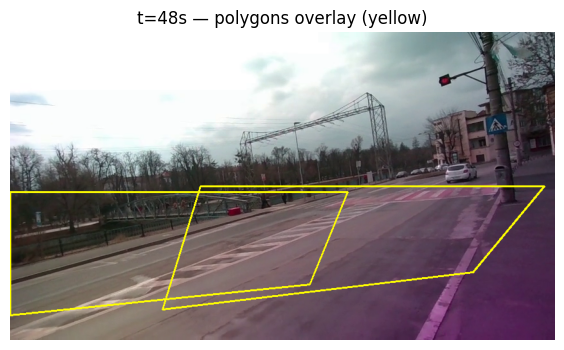

crosswalk_only_1min_v8.mp4 crosswalk_only_1min_v8.jsonl


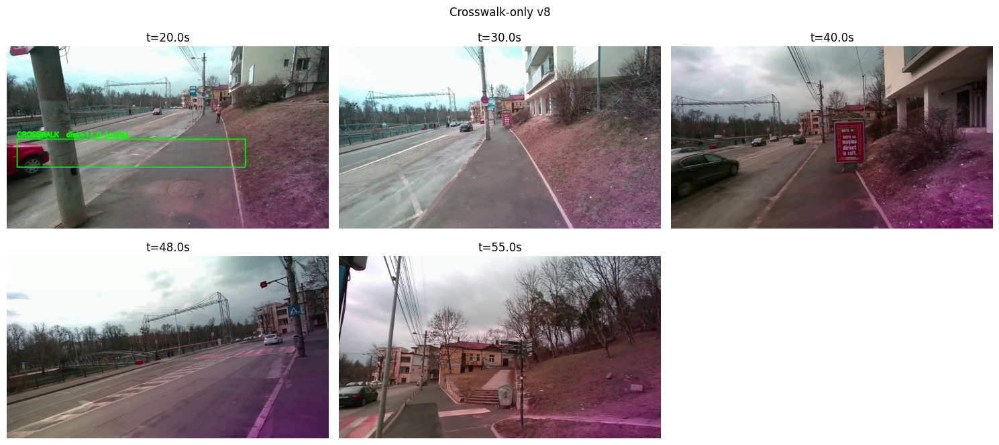

In [ ]:
import cv2, numpy as np, json, re, matplotlib.pyplot as plt
from scipy.signal import find_peaks

PARAM.update({
    "white_L_sigma": 0.55,
    "rgb_white": 195,
    "red_S_min": 85,
    "red_V_min": 55,
    "zebra_width_frac": 0.33,
    "score_min": 0.60
})

CROSS_POLYS = [
    np.array([
        [0.00, 0.52],
        [0.62, 0.52],
        [0.55, 0.82],
        [0.00, 0.92],
    ], dtype=np.float32),
    np.array([
        [0.35, 0.50],
        [0.98, 0.50],
        [0.85, 0.78],
        [0.28, 0.90],
    ], dtype=np.float32),
]

def make_poly_mask_multi(shape_hw, polys_norm):
    H, W = shape_hw
    mask = np.zeros((H, W), np.uint8)
    for poly in polys_norm:
        pts = np.stack([poly[:,0]*W, poly[:,1]*H], axis=1).astype(np.int32)
        cv2.fillPoly(mask, [pts], 255)
    return mask

def detect_crosswalk_final_with_polylist(rgb_full: np.ndarray, depth_full: np.ndarray) -> list:
    H,W = rgb_full.shape[:2]
    poly = make_poly_mask_multi((H,W), CROSS_POLYS)

    norm = normalize_brightness(rgb_full)
    wmask = white_mask_strict(norm)
    rmask = red_mask_hsv(norm)
    road  = road_mask_hsv(rgb_full)
    ban   = depth_ban_mask(depth_full)

    cand = cv2.bitwise_or(wmask, rmask)
    cand = cv2.bitwise_and(cand, road)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(ban))
    cand = cv2.bitwise_and(cand, poly)

    detections = []

    # Mode A: white zebra periodicity
    proj = np.sum(cand==255, axis=1)
    if np.any(proj):
        thr = np.percentile(proj[proj>0], 70)
        peaks, _ = find_peaks(proj, height=thr, distance=10)
        if len(peaks) >= 3:
            diffs = np.diff(peaks)
            if len(diffs) >= 2 and np.std(diffs) <= 12:
                y_min = max(0, int(np.min(peaks)-6))
                y_max = min(H-1, int(np.max(peaks)+6))
                col_hist = np.sum(cand[y_min:y_max+1]==255, axis=0)
                xs = np.where(col_hist > 0.18*(y_max-y_min+1))[0]
                if xs.size>0:
                    x_min, x_max = int(xs[0]), int(xs[-1])
                    if (x_max-x_min) > PARAM["zebra_width_frac"]*W:
                        edges = cv2.Canny(cand[y_min:y_max+1, x_min:x_max], 60, 120)
                        ang = mean_line_angle_deg(edges)
                        if ang <= 12.0:
                            dist = float(np.median(depth_full[max(0,y_max-2):min(H,y_max+3), x_min:x_max]))
                            score = 0.5*len(peaks) + 0.5*((x_max-x_min)/max(1,W))
                            detections.append(Detection("crosswalk",(x_min,y_min,x_max-x_min,y_max-y_min),dist,score))

    # Mode B: red painted panel
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(rmask, connectivity=8)
    if num_labels>1:
        idx = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
        x,y,w,h,area = stats[idx, cv2.CC_STAT_LEFT], stats[idx, cv2.CC_STAT_TOP], \
                       stats[idx, cv2.CC_STAT_WIDTH], stats[idx, cv2.CC_STAT_HEIGHT], \
                       stats[idx, cv2.CC_STAT_AREA]
        comp = np.zeros_like(rmask); comp[labels==idx]=255
        poly = make_poly_mask_multi((H,W), CROSS_POLYS)
        inside = np.sum(cv2.bitwise_and(comp, poly)==255)/(area+1e-6)
        onroad = np.sum(cv2.bitwise_and(comp, road)==255)/(area+1e-6)
        noban  = 1.0 - np.sum(cv2.bitwise_and(comp, ban)==255)/(area+1e-6)
        edges  = cv2.Canny(comp, 60, 120)
        ang    = mean_line_angle_deg(edges)
        if w>0.40*W and h<0.38*H and area>0.02*W*H and inside>0.5 and onroad>0.5 and noban>0.80 and ang<=14.0:
            dist = float(np.median(depth_full[max(0,y+h-2):min(H,y+h+3), x:x+w]))
            score = 0.6*(w/W) + 0.4*onroad
            detections.append(Detection("crosswalk",(x,y,w,h),dist,score))

    detections.sort(key=lambda d: d.score, reverse=True)
    return detections[:1]

def parse_ts(ts):
    if isinstance(ts, (int,float)): return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m:
        mm, ss = m.groups(); return int(mm)*60 + float(ss)
    return float(ts)

def frame_at_time(video_path, tsec, default_fps=30.0):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or default_fps
    idx = int(round(fps * tsec))
    cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
    ok, fr = cap.read()
    cap.release()
    return ok, fr

def draw_polys(img, polys):
    H,W = img.shape[:2]
    out = img.copy()
    for poly in polys:
        pts = np.stack([poly[:,0]*W, poly[:,1]*H], axis=1).astype(np.int32)
        cv2.polylines(out, [pts], isClosed=True, color=(0,255,255), thickness=2)
    return out

ok, fr = frame_at_time(COLOR_PATH, parse_ts("0:48"))
if ok:
    vis = draw_polys(fr, CROSS_POLYS)
    plt.figure(figsize=(8,4)); plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title("t=48s — polygons overlay (yellow)"); plt.axis("off"); plt.show()

def run_crosswalk_only_v8(color_path, depth_path,
                          out_video="crosswalk_only_1min_v8.mp4",
                          out_jsonl="crosswalk_only_1min_v8.jsonl",
                          seconds=60.0):
    cap = cv2.VideoCapture(color_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    max_frames = min(int(round(seconds*fps)), total)

    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open videos.")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0

    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), FPS, (W,H))
    smoother = TemporalSmoother(maxlen=5)

    with open(out_jsonl, "w") as fjson:
        idx = 0
        while idx < max_frames:
            ok_c, frgb = cap_c.read()
            ok_d, fdep_bgr = cap_d.read()
            if not ok_c or not ok_d: break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets = detect_crosswalk_final_with_polylist(frgb, fdep)
            smoother.push(dets)
            fused = [d for d in smoother.fused() if d.score >= PARAM["score_min"]]

            for d in fused:
                x,y,w,h = d.bbox
                cv2.rectangle(frgb, (x,y), (x+w,y+h), (0,255,0), 2)
                cv2.putText(frgb, f"CROSSWALK  dist={d.distance_units:.1f} (units)",
                            (x, max(18,y-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2, cv2.LINE_AA)

            writer.write(frgb)
            rec = {"frame_idx": int(idx),
                   "detections": [{"kind": d.kind, "bbox":[int(x) for x in d.bbox],
                                   "distance_units": float(d.distance_units),
                                   "score": float(d.score)} for d in fused]}
            fjson.write(json.dumps(rec) + "\n")
            idx += 1

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl

outv, outj = run_crosswalk_only_v8(COLOR_PATH, DEPTH_PATH, seconds=60.0)
print(outv, outj)

def preview_by_time(video_path, times, cols=3, title="Preview"):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    frames=[]
    for t in times:
        if isinstance(t,(int,float)): sec=float(t)
        else:
            m=re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(t).strip())
            if m: sec=int(m.group(1))*60+float(m.group(2))
            else: sec=float(t)
        idx=int(round(sec*fps))
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok,fr=cap.read()
        if ok: frames.append((sec, cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)))
    cap.release()
    if not frames:
        print("No frames");
    rows=int(np.ceil(len(frames)/cols))
    plt.figure(figsize=(5*cols,3.5*rows))
    for i,(s,img) in enumerate(frames):
        plt.subplot(rows,cols,i+1); plt.imshow(img); plt.axis("off"); plt.title(f"t={s:.1f}s")
    plt.suptitle(title); plt.tight_layout(); plt.show()

preview_by_time(outv, times=[20, 30, 40, 48, 55], cols=3, title="Crosswalk-only v8")


**Suppress sidewalk+ min color coverage in bbox**

crosswalk_only_1min_v9.mp4 crosswalk_only_1min_v9.jsonl


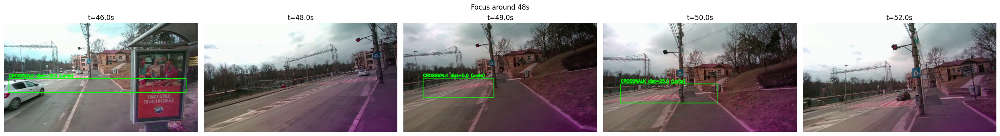

In [ ]:
import cv2, numpy as np, json, re, matplotlib.pyplot as plt
from scipy.signal import find_peaks

PARAM.update({
    "white_L_sigma": 0.55,
    "rgb_white": 195,
    "red_S_min": 85,
    "red_V_min": 55,
    "zebra_width_frac": 0.33,
    "score_min": 0.60
})

def sidewalk_exclude_mask(bgr: np.ndarray) -> np.ndarray:
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    H,S,V = cv2.split(hsv)
    m = (H >= 145) & (H <= 170) & (S >= 80) & (V >= 60)
    mask = m.astype(np.uint8) * 255
    mask = cv2.morphologyEx(mask, cv2.MORPH_DILATE, np.ones((7,7), np.uint8))
    return mask

CROSS_POLYS = [
    np.array([[0.00,0.52],[0.62,0.52],[0.55,0.82],[0.00,0.92]], dtype=np.float32),
    np.array([[0.35,0.50],[0.98,0.50],[0.85,0.78],[0.28,0.90]], dtype=np.float32),
]

def make_poly_mask_multi(shape_hw, polys_norm):
    H, W = shape_hw
    mask = np.zeros((H, W), np.uint8)
    for poly in polys_norm:
        pts = np.stack([poly[:,0]*W, poly[:,1]*H], axis=1).astype(np.int32)
        cv2.fillPoly(mask, [pts], 255)
    return mask

def detect_crosswalk_v9(rgb_full: np.ndarray, depth_full: np.ndarray):
    H,W = rgb_full.shape[:2]
    poly = make_poly_mask_multi((H,W), CROSS_POLYS)

    norm  = normalize_brightness(rgb_full)
    wmask = white_mask_strict(norm)
    rmask = red_mask_hsv(norm)
    road  = road_mask_hsv(rgb_full)
    ban   = depth_ban_mask(depth_full)
    side  = sidewalk_exclude_mask(rgb_full)

    cand = cv2.bitwise_or(wmask, rmask)
    cand = cv2.bitwise_and(cand, road)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(ban))
    cand = cv2.bitwise_and(cand, poly)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(side))

    detections = []

    proj = np.sum(cand==255, axis=1)
    if np.any(proj):
        thr = np.percentile(proj[proj>0], 70)
        peaks, _ = find_peaks(proj, height=thr, distance=10)
        if len(peaks) >= 3:
            diffs = np.diff(peaks)
            if len(diffs) >= 2 and np.std(diffs) <= 12:
                y_min = max(0, int(np.min(peaks)-6))
                y_max = min(H-1, int(np.max(peaks)+6))
                col_hist = np.sum(cand[y_min:y_max+1]==255, axis=0)
                xs = np.where(col_hist > 0.18*(y_max-y_min+1))[0]
                if xs.size>0:
                    x_min, x_max = int(xs[0]), int(xs[-1])
                    if (x_max-x_min) > PARAM["zebra_width_frac"]*W:
                        edges = cv2.Canny(cand[y_min:y_max+1, x_min:x_max], 60, 120)
                        bbox = cand[y_min:y_max+1, x_min:x_max]
                        coverage = float(np.mean(bbox==255))
                        ang = mean_line_angle_deg(edges)
                        if ang <= 12.0 and coverage >= 0.10:
                            dist = float(np.median(depth_full[max(0,y_max-2):min(H,y_max+3), x_min:x_max]))
                            score = 0.5*len(peaks) + 0.5*((x_max-x_min)/max(1,W)) + 0.5*coverage
                            detections.append(Detection("crosswalk",(x_min,y_min,x_max-x_min,y_max-y_min),dist,score))

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(rmask, connectivity=8)
    if num_labels>1:
        idx = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
        x,y,w,h,area = stats[idx, cv2.CC_STAT_LEFT], stats[idx, cv2.CC_STAT_TOP], \
                       stats[idx, cv2.CC_STAT_WIDTH], stats[idx, cv2.CC_STAT_HEIGHT], \
                       stats[idx, cv2.CC_STAT_AREA]
        comp = np.zeros_like(rmask); comp[labels==idx]=255
        inside = np.sum(cv2.bitwise_and(comp, poly)==255)/(area+1e-6)
        onroad = np.sum(cv2.bitwise_and(comp, road)==255)/(area+1e-6)
        noban  = 1.0 - np.sum(cv2.bitwise_and(comp, ban)==255)/(area+1e-6)
        notside= 1.0 - np.sum(cv2.bitwise_and(comp, side)==255)/(area+1e-6)
        edges  = cv2.Canny(comp, 60, 120)
        ang    = mean_line_angle_deg(edges)
        coverage = np.sum(comp[y:y+h, x:x+w]==255)/(w*h + 1e-6)
        if w>0.40*W and h<0.38*H and area>0.02*W*H and inside>0.5 and onroad>0.5 \
           and noban>0.80 and notside>0.85 and ang<=14.0 and coverage>=0.12:
            dist = float(np.median(depth_full[max(0,y+h-2):min(H,y+h+3), x:x+w]))
            score = 0.6*(w/W) + 0.2*onroad + 0.2*coverage
            detections.append(Detection("crosswalk",(x,y,w,h),dist,score))

    detections.sort(key=lambda d: d.score, reverse=True)
    return detections[:1]

def run_crosswalk_only_v9(color_path, depth_path,
                          out_video="crosswalk_only_1min_v9.mp4",
                          out_jsonl="crosswalk_only_1min_v9.jsonl",
                          seconds=60.0):
    cap = cv2.VideoCapture(color_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    max_frames = min(int(round(seconds*fps)), total)

    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open videos.")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0

    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), FPS, (W,H))
    smoother = TemporalSmoother(maxlen=5)

    with open(out_jsonl, "w") as fjson:
        idx=0
        while idx < max_frames:
            ok_c, frgb = cap_c.read()
            ok_d, fdep_bgr = cap_d.read()
            if not ok_c or not ok_d: break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets = detect_crosswalk_v9(frgb, fdep)
            smoother.push(dets)
            fused = [d for d in smoother.fused() if d.score >= PARAM["score_min"]]

            for d in fused:
                x,y,w,h = d.bbox
                cv2.rectangle(frgb,(x,y),(x+w,y+h),(0,255,0),2)
                cv2.putText(frgb, f"CROSSWALK dist={d.distance_units:.1f} (units)",
                            (x, max(18,y-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.6,(0,255,0),2,cv2.LINE_AA)

            writer.write(frgb)
            rec = {"frame_idx": int(idx),
                   "detections":[{"kind": d.kind, "bbox":[int(x) for x in d.bbox],
                                  "distance_units": float(d.distance_units),
                                  "score": float(d.score)} for d in fused]}
            fjson.write(json.dumps(rec)+"\n")
            idx += 1

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl

vid_v9, js_v9 = run_crosswalk_only_v9(COLOR_PATH, DEPTH_PATH, seconds=60.0)
print(vid_v9, js_v9)

def parse_ts(ts):
    if isinstance(ts,(int,float)): return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m: mm, ss = m.groups(); return int(mm)*60 + float(ss)
    return float(ts)

def preview_by_time(video_path, times, cols=3, title="Crosswalk-only v9"):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    frames=[]
    for t in times:
        s = parse_ts(t); idx = int(round(s*fps))
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, fr = cap.read()
        if ok: frames.append((s, cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)))
    cap.release()
    if not frames:
        print("No frames"); return
    rows = int(np.ceil(len(frames)/cols))
    plt.figure(figsize=(5*cols,3.5*rows))
    for i,(s,img) in enumerate(frames):
        plt.subplot(rows,cols,i+1); plt.imshow(img); plt.axis("off"); plt.title(f"t={s:.1f}s")
    plt.suptitle(title); plt.tight_layout(); plt.show()

preview_by_time(vid_v9, times=[46, 48, 49, 50, 52], cols=5, title="Focus around 48s")

**Temporal latch for crosswalks + lightweight geometry gates**

crosswalk_only_stable_1min.mp4 crosswalk_only_stable_1min.jsonl


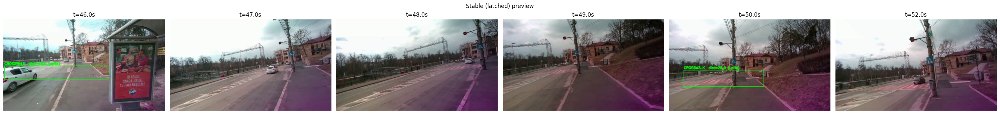

In [ ]:
from collections import deque

class CrosswalkLatch:
    def __init__(self, on_hits=3, off_misses=6):
        self.on_hits = on_hits
        self.off_misses = off_misses
        self.hit = 0
        self.miss = 0
        self.latched_det = None

    def update(self, dets):
        if dets:
            best = max(dets, key=lambda d: d.score)
            self.hit += 1
            self.miss = 0
            if self.hit >= self.on_hits:
                self.latched_det = best
        else:
            self.miss += 1
            self.hit = 0
            if self.miss >= self.off_misses:
                self.latched_det = None
        return self.latched_det

def bbox_geometry_ok(d: Detection, H, W):
    # Fast geometry filter to suppress odd boxes
    x,y,w,h = d.bbox
    y_ok = y > int(0.35*H)
    w_ok = w >= int(0.30*W)
    ar_ok = (w / max(1, h)) >= 2.5
    return y_ok and w_ok and ar_ok

def run_crosswalk_only_stable(color_path: str, depth_path: str,
                              out_video: str = "crosswalk_only_stable_1min.mp4",
                              out_jsonl: str = "crosswalk_only_stable_1min.jsonl",
                              seconds: float = 60.0):
    cap = cv2.VideoCapture(color_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    max_frames = min(int(round(seconds*fps)), total)

    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open videos.")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0

    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), FPS, (W,H))
    latch = CrosswalkLatch(on_hits=3, off_misses=8)

    with open(out_jsonl, "w") as fjson:
        idx = 0
        while idx < max_frames:
            ok_c, frgb = cap_c.read()
            ok_d, fdep_bgr = cap_d.read()
            if not ok_c or not ok_d: break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets_raw = detect_crosswalk_v9(frgb, fdep)
            dets = [d for d in dets_raw if bbox_geometry_ok(d, H, W) and d.score >= PARAM["score_min"]]

            latched = latch.update(dets)

            if latched is not None:
                x,y,w,h = latched.bbox
                cv2.rectangle(frgb,(x,y),(x+w,y+h),(0,255,0),2)
                cv2.putText(frgb, f"CROSSWALK  dist={latched.distance_units:.1f} (units)",
                            (x, max(18,y-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.6,(0,255,0),2,cv2.LINE_AA)

            writer.write(frgb)
            rec = {"frame_idx": int(idx),
                   "latched": (latched is not None),
                   "detection": None if latched is None else {
                       "bbox":[int(v) for v in latched.bbox],
                       "distance_units": float(latched.distance_units),
                       "score": float(latched.score)
                   }}
            fjson.write(json.dumps(rec)+"\n")
            idx += 1

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl

stable_vid, stable_json = run_crosswalk_only_stable(COLOR_PATH, DEPTH_PATH, seconds=60.0)
print(stable_vid, stable_json)

preview_by_time(stable_vid, times=[46, 47, 48, 49, 50, 52], cols=6, title="Stable (latched) preview")

Saved preview to preview_crosswalk_only_stable.png


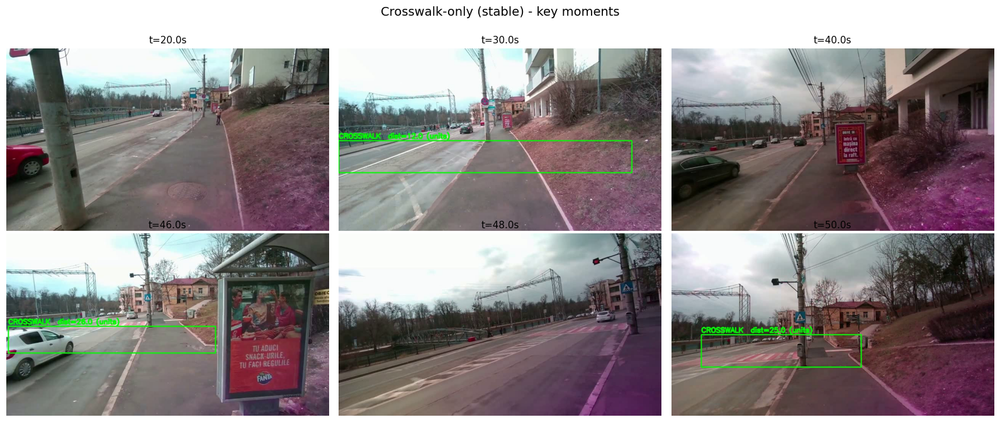

In [ ]:
import cv2, numpy as np, matplotlib.pyplot as plt, re, os

def _parse_ts(ts):
    if isinstance(ts, (int,float)): return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m: mm, ss = m.groups(); return int(mm)*60 + float(ss)
    return float(ts)

def pretty_preview_grid(video_path, times, cols=3, title="preview", save_path=None, max_width_px=1600):
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    frames = []
    for t in times:
        sec = _parse_ts(t); idx = int(round(sec * fps))
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, fr = cap.read()
        if ok:
            frames.append((sec, cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)))
    cap.release()
    if not frames:
        print("No frames."); return

    rows = int(np.ceil(len(frames)/cols))
    base_w = max_width_px / cols / 100.0
    base_h = base_w * 9/16
    plt.figure(figsize=(base_w*cols, base_h*rows + 0.8))
    for i, (s, img) in enumerate(frames):
        plt.subplot(rows, cols, i+1)
        plt.imshow(img); plt.axis("off"); plt.title(f"t={s:.1f}s", fontsize=11)
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.96])
    if save_path:
        os.makedirs(os.path.dirname(save_path) or ".", exist_ok=True)
        plt.savefig(save_path, dpi=180)
        print(f"Saved preview to {save_path}")
    plt.show()

pretty_preview_grid(
    "crosswalk_only_stable_1min.mp4",
    times=[20, 30, 40, 46, 48, 50],
    cols=3,
    title="Crosswalk-only (stable) - key moments",
    save_path="preview_crosswalk_only_stable.png"
)

**Accuracy polish: gray-world WB + majority vote + bbox smoothing**

crosswalk_only_stable_polished_1min.mp4 crosswalk_only_stable_polished_1min.jsonl
Saved preview to preview_crosswalk_polished.png


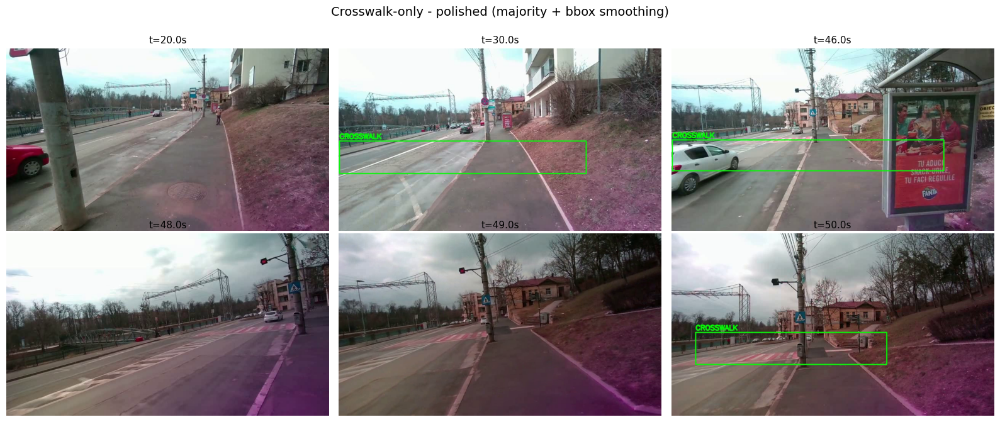

In [ ]:
import numpy as np, cv2, json
from collections import deque

def gray_world_white_balance(bgr: np.ndarray) -> np.ndarray:
    b,g,r = cv2.split(bgr.astype(np.float32))
    mb, mg, mr = np.mean(b), np.mean(g), np.mean(r)
    m = (mb + mg + mr) / 3.0 + 1e-6
    kb, kg, kr = m/mb, m/mg, m/mr
    out = cv2.merge([np.clip(b*kb,0,255), np.clip(g*kg,0,255), np.clip(r*kr,0,255)]).astype(np.uint8)
    return out

def normalize_brightness_wb(bgr: np.ndarray) -> np.ndarray:
    wb = gray_world_white_balance(bgr)
    lab = cv2.cvtColor(wb, cv2.COLOR_BGR2LAB)
    L,A,B = cv2.split(lab)
    L2 = cv2.createCLAHE(2.0, (8,8)).apply(L)
    return cv2.cvtColor(cv2.merge([L2,A,B]), cv2.COLOR_LAB2BGR)

def detect_crosswalk_v9_wb(rgb_full, depth_full):
    H,W = rgb_full.shape[:2]
    poly = make_poly_mask_multi((H,W), CROSS_POLYS)
    norm  = normalize_brightness_wb(rgb_full)
    wmask = white_mask_strict(norm)
    rmask = red_mask_hsv(norm)
    road  = road_mask_hsv(rgb_full)
    ban   = depth_ban_mask(depth_full)
    side  = sidewalk_exclude_mask(rgb_full)

    cand = cv2.bitwise_or(wmask, rmask)
    cand = cv2.bitwise_and(cand, road)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(ban))
    cand = cv2.bitwise_and(cand, poly)
    cand = cv2.bitwise_and(cand, cv2.bitwise_not(side))

    detections = []
    proj = np.sum(cand==255, axis=1)
    if np.any(proj):
        from scipy.signal import find_peaks
        thr = np.percentile(proj[proj>0], 70)
        peaks, _ = find_peaks(proj, height=thr, distance=10)
        if len(peaks) >= 3:
            diffs = np.diff(peaks)
            if len(diffs) >= 2 and np.std(diffs) <= 12:
                y_min = max(0, int(np.min(peaks)-6))
                y_max = min(H-1, int(np.max(peaks)+6))
                col_hist = np.sum(cand[y_min:y_max+1]==255, axis=0)
                xs = np.where(col_hist > 0.18*(y_max-y_min+1))[0]
                if xs.size>0:
                    x_min, x_max = int(xs[0]), int(xs[-1])
                    if (x_max-x_min) > PARAM["zebra_width_frac"]*W:
                        edges = cv2.Canny(cand[y_min:y_max+1, x_min:x_max], 60, 120)
                        ang = mean_line_angle_deg(edges)
                        bbox = cand[y_min:y_max+1, x_min:x_max]
                        coverage = float(np.mean(bbox==255))
                        if ang <= 12.0 and coverage >= 0.10:
                            dist = float(np.median(depth_full[max(0,y_max-2):min(H,y_max+3), x_min:x_max]))
                            score = 0.5*len(peaks) + 0.5*((x_max-x_min)/max(1,W)) + 0.5*coverage
                            detections.append(Detection("crosswalk",(x_min,y_min,x_max-x_min,y_max-y_min),dist,score))
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(rmask, connectivity=8)
    if num_labels>1:
        idx = 1 + int(np.argmax(stats[1:, cv2.CC_STAT_AREA]))
        x,y,w,h,area = stats[idx, cv2.CC_STAT_LEFT], stats[idx, cv2.CC_STAT_TOP], \
                       stats[idx, cv2.CC_STAT_WIDTH], stats[idx, cv2.CC_STAT_HEIGHT], \
                       stats[idx, cv2.CC_STAT_AREA]
        comp = np.zeros_like(rmask); comp[labels==idx]=255
        inside = np.sum(cv2.bitwise_and(comp, make_poly_mask_multi((H,W), CROSS_POLYS))==255)/(area+1e-6)
        onroad = np.sum(cv2.bitwise_and(comp, road)==255)/(area+1e-6)
        noban  = 1.0 - np.sum(cv2.bitwise_and(comp, ban)==255)/(area+1e-6)
        notside= 1.0 - np.sum(cv2.bitwise_and(comp, side)==255)/(area+1e-6)
        edges  = cv2.Canny(comp, 60, 120)
        ang    = mean_line_angle_deg(edges)
        coverage = np.sum(comp[y:y+h, x:x+w]==255)/(w*h + 1e-6)
        if w>0.40*W and h<0.38*H and area>0.02*W*H and inside>0.5 and onroad>0.5 \
           and noban>0.80 and notside>0.85 and ang<=14.0 and coverage>=0.12:
            dist = float(np.median(depth_full[max(0,y+h-2):min(H,y+h+3), x:x+w]))
            score = 0.6*(w/W) + 0.2*onroad + 0.2*coverage
            detections.append(Detection("crosswalk",(x,y,w,h),dist,score))
    detections.sort(key=lambda d: d.score, reverse=True)
    return detections[:1]

class MajorityLatch:
    def __init__(self, window=9, keep_after=6, bbox_alpha=0.25):
        self.window = window
        self.keep_after = keep_after
        self.queue = deque(maxlen=window)
        self.keep = 0
        self.bbox_smoothed = None
        self.alpha = bbox_alpha

    def _smooth_bbox(self, bbox):
        if self.bbox_smoothed is None:
            self.bbox_smoothed = np.array(bbox, dtype=np.float32)
        else:
            self.bbox_smoothed = (1-self.alpha)*self.bbox_smoothed + self.alpha*np.array(bbox, dtype=np.float32)
        x,y,w,h = self.bbox_smoothed
        return (int(round(x)), int(round(y)), int(round(w)), int(round(h)))

    def update(self, dets):
        self.queue.append(1 if dets else 0)
        if sum(self.queue) > len(self.queue)//2:
            d = max(dets, key=lambda d: d.score) if dets else None
            if d is None: return None
            self.keep = self.keep_after
            return Detection(d.kind, self._smooth_bbox(d.bbox), d.distance_units, d.score)
        else:
            if self.keep > 0:
                self.keep -= 1
                if self.bbox_smoothed is not None:
                    x,y,w,h = self._smooth_bbox(self.bbox_smoothed)
                    return Detection("crosswalk", (x,y,w,h), 0.0, 0.0)
            return None

def run_crosswalk_only_stable_polished(color_path, depth_path,
                                       out_video="crosswalk_only_stable_polished_1min.mp4",
                                       out_jsonl="crosswalk_only_stable_polished_1min.jsonl",
                                       seconds=60.0):
    cap = cv2.VideoCapture(color_path)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30.0
    tot = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    max_frames = min(int(round(seconds*fps)), tot)

    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    FPS = cap_c.get(cv2.CAP_PROP_FPS) or 30.0
    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), FPS, (W,H))

    latch = MajorityLatch(window=9, keep_after=8, bbox_alpha=0.2)

    with open(out_jsonl, "w") as fjson:
        idx=0
        while idx < max_frames:
            ok1, frgb = cap_c.read(); ok2, fdep_bgr = cap_d.read()
            if not (ok1 and ok2): break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets = detect_crosswalk_v9_wb(frgb, fdep)
            dets = [d for d in dets if d.score >= PARAM["score_min"]]

            dlat = latch.update(dets)
            if dlat:
                x,y,w,h = dlat.bbox
                cv2.rectangle(frgb,(x,y),(x+w,y+h),(0,255,0),2)
                cv2.putText(frgb, "CROSSWALK", (x, max(18,y-6)), cv2.FONT_HERSHEY_SIMPLEX, 0.6,(0,255,0),2,cv2.LINE_AA)

            writer.write(frgb)
            fjson.write(json.dumps({
                "frame_idx": int(idx),
                "on": bool(dlat),
                "bbox": None if not dlat else [int(v) for v in dlat.bbox]
            })+"\n")
            idx+=1

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl

vid_pol, js_pol = run_crosswalk_only_stable_polished(COLOR_PATH, DEPTH_PATH, seconds=60.0)
print(vid_pol, js_pol)
pretty_preview_grid(vid_pol, times=[20, 30, 46, 48, 49, 50], cols=3,
                    title="Crosswalk-only - polished (majority + bbox smoothing)",
                    save_path="preview_crosswalk_polished.png")



---





---



Run crosswalk detector only on selected time windows

In [ ]:
import cv2, numpy as np, os, re, json, matplotlib.pyplot as plt
from collections import deque

SNIPPET_TIMES = ["0:48",  "0:50"]
WINDOW_SEC    = 6.0
OUT_DIR       = "snippets"

os.makedirs(OUT_DIR, exist_ok=True)

def _parse_ts(ts):
    if isinstance(ts, (int,float)): return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m: mm, ss = m.groups(); return int(mm)*60 + float(ss)
    return float(ts)

_detect_fn = None
for fn in ["detect_crosswalk_v9_wb", "detect_crosswalk_v9", "detect_crosswalk_final_with_polylist", "detect_crosswalk_final"]:
    if fn in globals():
        _detect_fn = globals()[fn]
        break
assert _detect_fn is not None, "No detector function found. Run the detector cells first."

class MiniLatch:
    def __init__(self, on_hits=2, off_misses=4):
        self.on_hits = on_hits
        self.off_misses = off_misses
        self.hit = 0
        self.miss = 0
        self.latched = None
    def update(self, dets):
        if dets:
            best = max(dets, key=lambda d: d.score)
            self.hit += 1; self.miss = 0
            if self.hit >= self.on_hits:
                self.latched = best
        else:
            self.miss += 1; self.hit = 0
            if self.miss >= self.off_misses:
                self.latched = None
        return self.latched

def _frame_count_fps(path, default_fps=30.0):
    cap = cv2.VideoCapture(path)
    fps = cap.get(cv2.CAP_PROP_FPS) or default_fps
    n   = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    return n, fps

def run_snippets(color_path, depth_path, times, window_sec=6.0, out_dir="snippets"):
    nC, fps = _frame_count_fps(color_path)
    nD, _   = _frame_count_fps(depth_path)
    n = min(nC, nD)
    half = window_sec/2.0
    results = []

    for t in times:
        tsec = _parse_ts(t)
        start_idx = max(0, int(round((tsec - half)*fps)))
        end_idx   = min(n-1, int(round((tsec + half)*fps)))
        if end_idx <= start_idx:
            print(f"Skip {t} (empty window)");
            continue

        cap_c = cv2.VideoCapture(color_path)
        cap_d = cv2.VideoCapture(depth_path)
        W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
        cap_c.set(cv2.CAP_PROP_POS_FRAMES, start_idx)
        cap_d.set(cv2.CAP_PROP_POS_FRAMES, start_idx)

        base = f"snippet_{int(round(tsec*1000))}ms"
        out_video = os.path.join(out_dir, f"{base}.mp4")
        out_json  = os.path.join(out_dir, f"{base}.jsonl")
        mid_png   = os.path.join(out_dir, f"{base}_mid.png")

        writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), fps, (W,H))
        latch  = MiniLatch(on_hits=2, off_misses=4)

        mid_idx = (start_idx + end_idx)//2
        mid_img = None

        with open(out_json, "w") as fjson:
            idx = start_idx
            while idx <= end_idx:
                ok1, frgb = cap_c.read()
                ok2, fdep_bgr = cap_d.read()
                if not (ok1 and ok2): break
                fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

                dets = _detect_fn(frgb, fdep)
                dets = [d for d in dets if d.score >= PARAM.get("score_min", 0.6)]

                latched = latch.update(dets)
                if latched is not None:
                    x,y,w,h = latched.bbox
                    cv2.rectangle(frgb,(x,y),(x+w,y+h),(0,255,0),2)
                    cv2.putText(frgb, "CROSSWALK", (x, max(18,y-6)),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0,255,0), 2, cv2.LINE_AA)

                if idx == mid_idx:
                    mid_img = cv2.cvtColor(frgb, cv2.COLOR_BGR2RGB)

                writer.write(frgb)
                rec = {"frame_idx": int(idx),
                       "latched": (latched is not None),
                       "bbox": None if latched is None else [int(v) for v in latched.bbox]}
                fjson.write(json.dumps(rec)+"\n")
                idx += 1

        writer.release(); cap_c.release(); cap_d.release()

        if mid_img is not None:
            import matplotlib.pyplot as plt
            plt.figure(figsize=(6,3.5)); plt.imshow(mid_img); plt.axis("off"); plt.title(f"t≈{tsec:.1f}s")
            plt.tight_layout(); plt.savefig(mid_png, dpi=160); plt.close()

        results.append((tsec, out_video, out_json, mid_png))
        print(f"Done snippet around t={tsec:.2f}s  -> {out_video}")

    return results

snippet_results = run_snippets(COLOR_PATH, DEPTH_PATH, SNIPPET_TIMES, window_sec=WINDOW_SEC, out_dir=OUT_DIR)
snippet_results

Done snippet around t=48.00s  -> snippets/snippet_48000ms.mp4
Done snippet around t=50.00s  -> snippets/snippet_50000ms.mp4


[(48.0,
  'snippets/snippet_48000ms.mp4',
  'snippets/snippet_48000ms.jsonl',
  'snippets/snippet_48000ms_mid.png'),
 (50.0,
  'snippets/snippet_50000ms.mp4',
  'snippets/snippet_50000ms.jsonl',
  'snippets/snippet_50000ms_mid.png')]

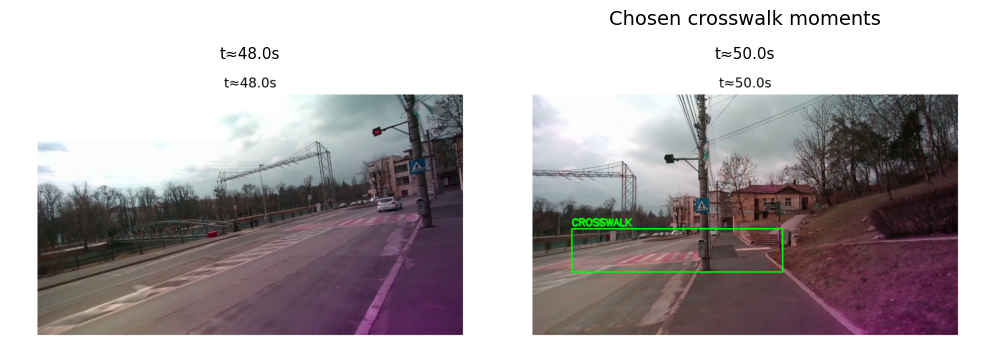

In [ ]:
def pretty_snippet_grid(results, cols=3, title="Crosswalk snippets"):
    imgs = []
    labels = []
    for tsec, _, _, mid_png in results:
        if os.path.exists(mid_png):
            img = cv2.cvtColor(cv2.imread(mid_png), cv2.COLOR_BGR2RGB)
            imgs.append(img); labels.append(f"t≈{tsec:.1f}s")
    if not imgs:
        print("No mid-frame PNGs found.")
        raise SystemExit

    rows = int(np.ceil(len(imgs)/cols))
    base_w = 5
    base_h = 5 * 9/16
    plt.figure(figsize=(base_w*cols, base_h*rows + 0.8))
    for i, (img, lab) in enumerate(zip(imgs, labels)):
        plt.subplot(rows, cols, i+1)
        plt.imshow(img); plt.axis("off"); plt.title(lab, fontsize=11)
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()

pretty_snippet_grid(snippet_results, cols=3, title="Chosen crosswalk moments")



---





---



crosswalk_range_04m30s_05m30s.mp4 crosswalk_range_04m30s_05m30s.jsonl


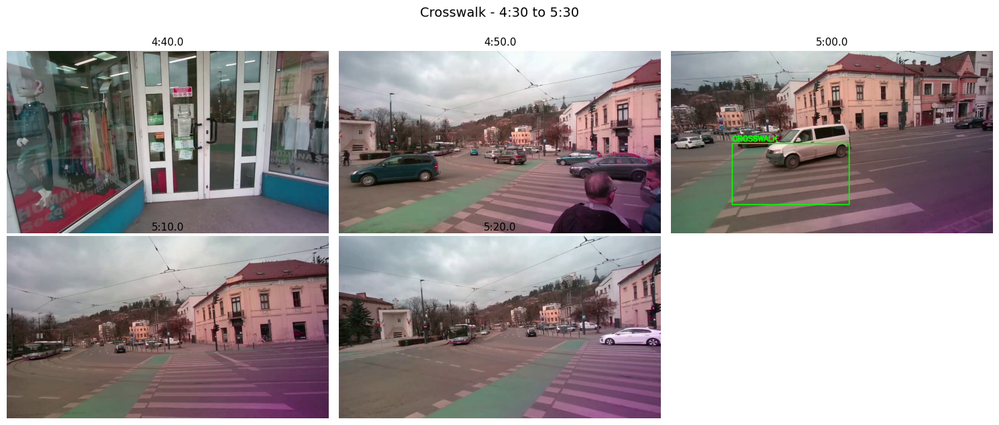

In [ ]:
import cv2, numpy as np, json, re, os, matplotlib.pyplot as plt
from collections import deque

RANGE_START = "4:30"
RANGE_END   = "5:30"
OUT_BASENAME = "crosswalk_range_04m30s_05m30s"

def _parse_ts(ts):
    if isinstance(ts, (int, float)):
        return float(ts)
    m = re.match(r"^(\d+):(\d+(?:\.\d+)?)$", str(ts).strip())
    if m:
        mm, ss = m.groups()
        return int(mm) * 60 + float(ss)
    return float(ts)

def _frames_fps(path, default_fps=30.0):
    cap = cv2.VideoCapture(path)
    fps = cap.get(cv2.CAP_PROP_FPS) or default_fps
    n   = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    cap.release()
    return n, fps

def _pick_detector():
    for fn in ["detect_crosswalk_v9_wb", "detect_crosswalk_whiteonly", "detect_crosswalk_v9", "detect_crosswalk_final_with_polylist", "detect_crosswalk_final"]:
        if fn in globals():
            return globals()[fn]
    raise RuntimeError("No detector function is defined yet")

class MiniLatch:
    # hysteresis for cleaner overlay in the snippet
    def __init__(self, on_hits=2, off_misses=4):
        self.on_hits = on_hits; self.off_misses = off_misses
        self.hit = 0; self.miss = 0; self.latched = None
    def update(self, dets):
        if dets:
            best = max(dets, key=lambda d: d.score)
            self.hit += 1; self.miss = 0
            if self.hit >= self.on_hits:
                self.latched = best
        else:
            self.miss += 1; self.hit = 0
            if self.miss >= self.off_misses:
                self.latched = None
        return self.latched

def run_crosswalk_on_range(color_path, depth_path, t_start, t_end, out_basename="range_out"):
    det_fn = _pick_detector()
    nC, fps = _frames_fps(color_path)
    nD, _   = _frames_fps(depth_path)
    n = min(nC, nD)

    start_sec = _parse_ts(t_start)
    end_sec   = _parse_ts(t_end)
    if end_sec <= start_sec:
        raise ValueError("End time must be greater than start tim")
    start_idx = max(0, int(round(start_sec * fps)))
    end_idx   = min(n-1, int(round(end_sec   * fps)))

    cap_c = cv2.VideoCapture(color_path)
    cap_d = cv2.VideoCapture(depth_path)
    if not cap_c.isOpened() or not cap_d.isOpened():
        raise RuntimeError("Could not open input videos!")
    W = int(cap_c.get(cv2.CAP_PROP_FRAME_WIDTH)); H = int(cap_c.get(cv2.CAP_PROP_FRAME_HEIGHT))
    cap_c.set(cv2.CAP_PROP_POS_FRAMES, start_idx)
    cap_d.set(cv2.CAP_PROP_POS_FRAMES, start_idx)

    out_video = f"{out_basename}.mp4"
    out_jsonl = f"{out_basename}.jsonl"
    writer = cv2.VideoWriter(out_video, cv2.VideoWriter_fourcc(*'mp4v'), fps, (W,H))
    latch  = MiniLatch(on_hits=2, off_misses=4)

    with open(out_jsonl, "w") as fjson:
        idx = start_idx
        while idx <= end_idx:
            ok1, frgb = cap_c.read()
            ok2, fdep_bgr = cap_d.read()
            if not (ok1 and ok2): break
            fdep = cv2.cvtColor(fdep_bgr, cv2.COLOR_BGR2GRAY)

            dets = det_fn(frgb, fdep)
            thr = globals().get("PARAM", {}).get("score_min", 0.6)
            dets = [d for d in dets if d.score >= thr]

            latched = latch.update(dets)
            if latched is not None:
                x,y,w,h = latched.bbox
                cv2.rectangle(frgb,(x,y),(x+w,y+h),(0,255,0),2)
                cv2.putText(frgb, "CROSSWALK", (x, max(18,y-6)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0,255,0), 2, cv2.LINE_AA)

            writer.write(frgb)
            rec = {
                "abs_time_sec": float(idx / fps),
                "frame_idx": int(idx),
                "latched": (latched is not None),
                "bbox": None if latched is None else [int(v) for v in latched.bbox]
            }
            fjson.write(json.dumps(rec) + "\n")
            idx += 1

    writer.release(); cap_c.release(); cap_d.release()
    return out_video, out_jsonl, fps, start_sec, end_sec

def pretty_preview_grid_absolute(video_path, fps, abs_start_sec, abs_times, cols=3, title="Preview"):
    rel_times = [max(0.0, t - abs_start_sec) for t in abs_times]
    cap = cv2.VideoCapture(video_path)
    frames = []
    for abs_t, rel_t in zip(abs_times, rel_times):
        idx = int(round(rel_t * fps))
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ok, fr = cap.read()
        if ok:
            frames.append((abs_t, cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)))
    cap.release()
    if not frames:
        print("No frames for the chosen absolute ties"); return

    rows = int(np.ceil(len(frames)/cols))
    base_w = 5; base_h = base_w * 9/16
    plt.figure(figsize=(base_w*cols, base_h*rows + 0.8))
    for i, (abs_s, img) in enumerate(frames):
        mm = int(abs_s // 60); ss = abs_s - 60*mm
        label = f"{mm}:{ss:04.1f}"
        plt.subplot(rows, cols, i+1)
        plt.imshow(img); plt.axis("off"); plt.title(label, fontsize=11)
    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()

out_vid, out_jsonl, _fps, abs_start, abs_end = run_crosswalk_on_range(
    COLOR_PATH, DEPTH_PATH, RANGE_START, RANGE_END, out_basename=OUT_BASENAME
)
print(out_vid, out_jsonl)

ABS_TIMES = [_parse_ts(t) for t in ["4:40","4:50","5:00","5:10","5:20"]]
pretty_preview_grid_absolute(out_vid, _fps, abs_start, ABS_TIMES,
                             cols=3, title=f"Crosswalk - {RANGE_START} to {RANGE_END}")